## Introduction

In this notebook, I will develop and test a Generative Adversarial Network (GAN) model designed to generate images in the style of Monet paintings for the Kaggle competition "I'm Something of a Painter Myself" (https://www.kaggle.com/competitions/gan-getting-started). This is an example of a generative AI application, where the task is to create new content, rather than to make classifications or predictions. 

First, I will import the relevant libraries:

In [34]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import os
import itertools
import zipfile
import shutil
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import (Dense, Reshape, Flatten, Dropout, BatchNormalization, LeakyReLU,
                                     Conv2D, Conv2DTranspose)
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam

The data included for this challenge includes a set of real Monet paintings and a set of photographs. A quick look at the two sets shows there are a total of 300 paintings and 7038 photos, both with dimensions of 256 x 256 pixels.

In [29]:
def read_images(path):
    imgs = [ Image.open(path + file) for file in os.listdir(path) ]
    return imgs
    
path_monet = '/kaggle/input/gan-getting-started/monet_jpg/'
path_photo = '/kaggle/input/gan-getting-started/photo_jpg/'
monet_imgs = read_images(path_monet)
photo_imgs = read_images(path_photo)
n_monet = len(monet_imgs)
n_photo = len(photo_imgs)

print(n_monet, n_photo)
print(monet_imgs[0].size, photo_imgs[0].size)

300 7038
(256, 256) (256, 256)


## Exploratory Data Analysis

Below are a few examples of Monet paintings in the dataset:

<Figure size 640x480 with 0 Axes>

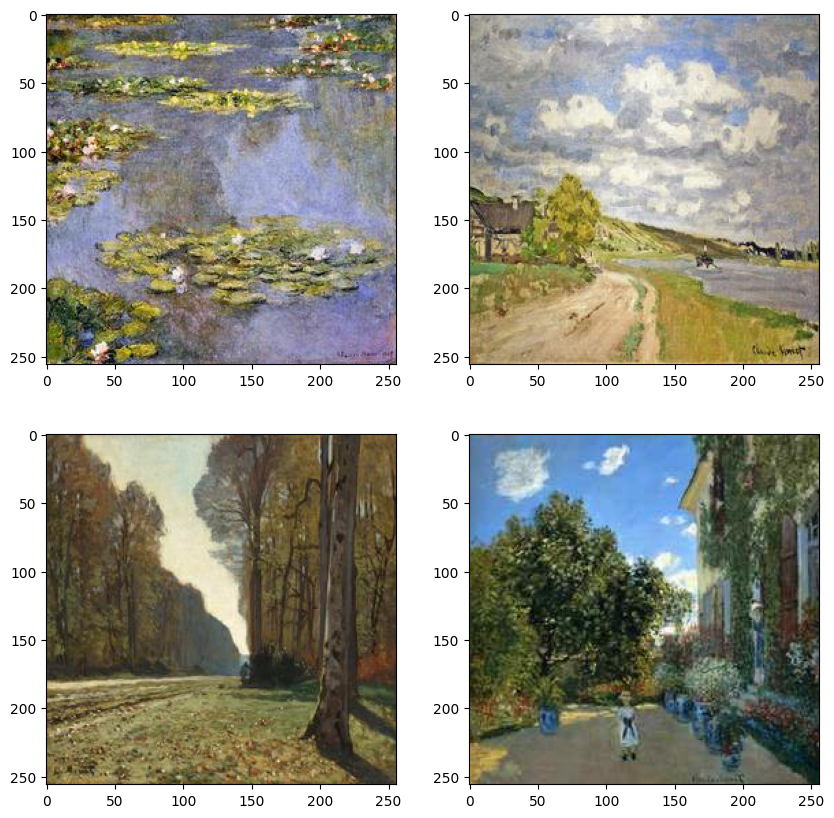

In [30]:
def view_sample(imgs):
    plt.figure()
    f, ax = plt.subplots(2,2,figsize=(10,10))
    ax[0][0].imshow(imgs[0])
    ax[0][1].imshow(imgs[1])
    ax[1][0].imshow(imgs[2])
    ax[1][1].imshow(imgs[3])

view_sample(monet_imgs)

To make sure there are no blank paintings in the folder, I will compute the average pixel magnitude for each painting and plot the averages in a histogram.

In [31]:
pixel_values = np.array([ img for img in monet_imgs ])
imgs_grey = np.linalg.norm(pixel_values/255.0, axis=3).reshape(n_monet, -1)
imgs_grey.shape

(300, 65536)

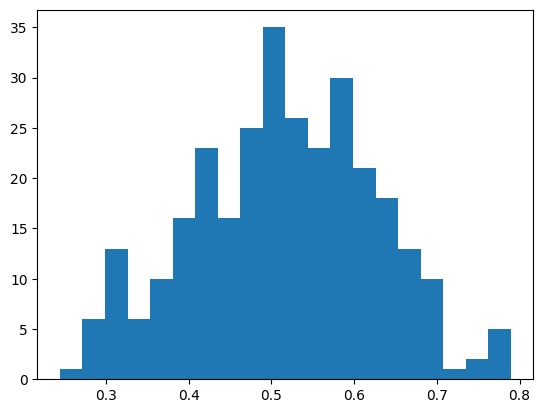

In [5]:
avg_magnitude = np.mean(imgs_grey/np.sqrt(3), axis=1)
plt.hist(avg_magnitude, bins=20)
plt.show()

The histogram shows a fairly normal distribution of average pixel magnitudes, ranging roughly from 0.3 to 0.8. There are no values of 0 or 1 to indicate blank pictures. 

Next, I will check if there are any duplicates in the dataset. The following function checks if any images have the exact same average magnitude, indicating a potential duplicate.

In [6]:
def check_duplicate(avg_magnitude):
    mags = {}
    duplicates = []
    for i in range(len(avg_magnitude)):
        m = avg_magnitude[i]
        if m in mags.keys():
            duplicates.append((mags[m], i))
        else:
            mags[m] = i

    return duplicates
    
duplicates = check_duplicate(avg_magnitude)
duplicates

[]

No duplicates were found in the Monet dataset. Next, I will repeat this analysis for the photo dataset.

<Figure size 640x480 with 0 Axes>

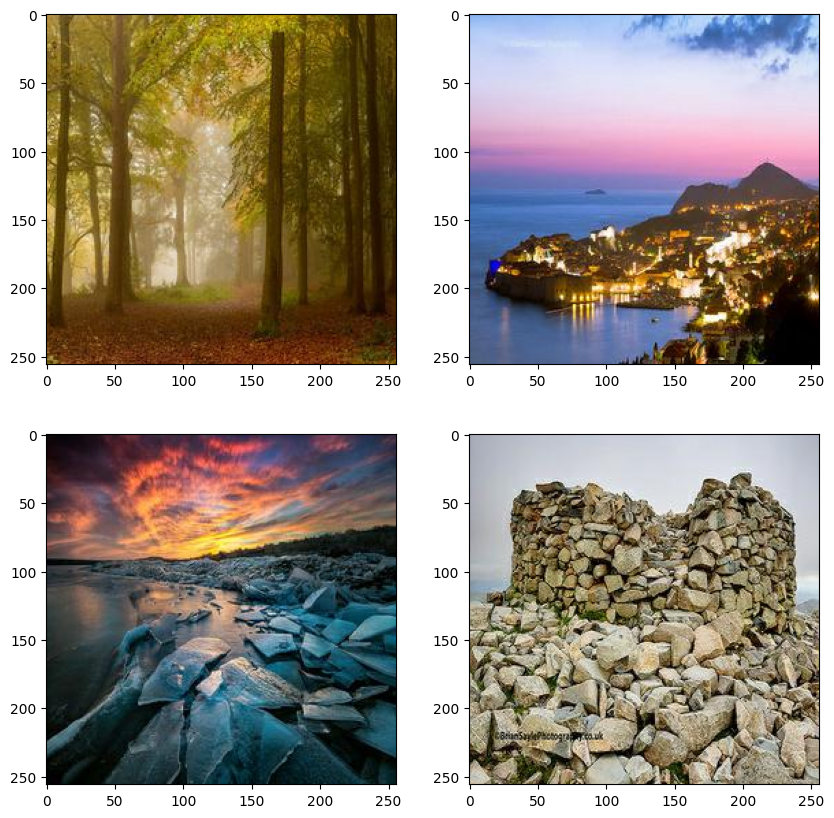

In [7]:
view_sample(photo_imgs)

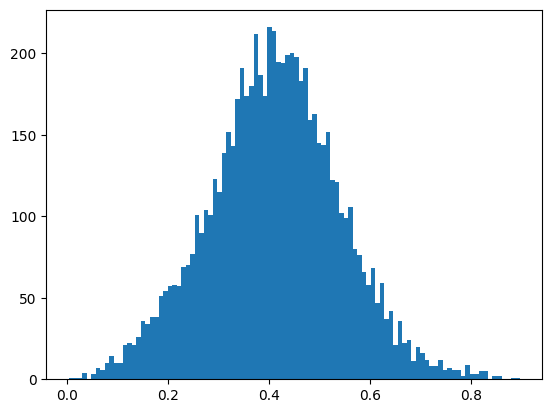

In [8]:
avg_magnitude = []

for img in photo_imgs:  # assume each img is a PIL.Image
    arr = (np.array(img, dtype=np.float32) / 255.0).reshape(256*256, 3)   # (H, W, 3)
    grey = np.linalg.norm(arr, axis=1) / np.sqrt(3) # grayscale brightness
    avg_magnitude.append(np.mean(grey))

plt.hist(avg_magnitude, bins=100)
plt.show()

There are no indications of blank images in the photo dataset. However, it is notable that the average pixel magnitude is lower (about 0.4) than that for the Monet dataset (0.5). 

In [9]:
duplicates = check_duplicate(avg_magnitude)
duplicates

[(110, 819),
 (772, 1694),
 (2053, 2161),
 (772, 3074),
 (2854, 3492),
 (1690, 3846),
 (501, 4285),
 (885, 4653),
 (3563, 5702),
 (2877, 6032),
 (2841, 6547),
 (1568, 6782),
 (807, 6876)]

13 photos were found to have the same average magnitude as other photos. To check if these are duplicates, I will take a look at the pairs of images:

<Figure size 640x480 with 0 Axes>

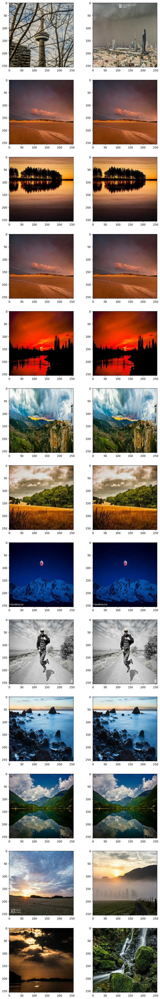

In [10]:
n = len(duplicates)
plt.figure()
f, ax = plt.subplots(n,2,figsize=(10,n*5))
for i in range(n):
    ax[i][0].imshow(photo_imgs[duplicates[i][0]])
    ax[i][1].imshow(photo_imgs[duplicates[i][1]])

All of these except for the first one and the last two are duplicates. I will remove them from the dataset for model training.

In [11]:
bad = [d[1] for d in duplicates[1:-2]]
print(bad)

[1694, 2161, 3074, 3492, 3846, 4285, 4653, 5702, 6032, 6547]


In [12]:
files = [file for file in os.listdir(path_photo)]
exclude_list = []
for i in range(n_photo):
    if i in bad:
        exclude_list.append(files[i])

exclude_set = tf.constant(exclude_list)

I0000 00:00:1756316394.521059      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


## Data Preprocessing

The following preprocessing function converts the .jpg input files into a Tensorflow dataset object for model training. The first step in preprocessing is to remove the duplicate images. The pixel values are also normalized to [-1, 1] format to be compatible with the tanh functions in the GAN architecture. For the first test, I have resized the images to 128 x 128 pixels to speed up the training.

In [38]:
def not_excluded(path):
    filename = tf.strings.split(path, os.sep)[-1]
    return ~tf.reduce_any(tf.equal(filename, exclude_set))
    
def preprocess(path, pixel_dim):
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img_bytes, channels=3)
    img = tf.image.resize(img, [pixel_dim, pixel_dim])
    img = (tf.cast(img, tf.float32) - 127.5) / 127.5
    return img

pixel_dim = 128

monets = (tf.data.Dataset.list_files(path_monet + "*.jpg", shuffle=True)
          .map(lambda x: preprocess(x, pixel_dim), num_parallel_calls=tf.data.AUTOTUNE)
          .shuffle(n_monet)
          .repeat()
          .batch(1)
          .prefetch(tf.data.AUTOTUNE))

photos = (tf.data.Dataset.list_files(path_photo + "*.jpg", shuffle=True)
          .filter(not_excluded)
          .map(lambda x: preprocess(x, pixel_dim), num_parallel_calls=tf.data.AUTOTUNE)
          .shuffle(n_photo)
          .repeat()
          .batch(1)
          .prefetch(tf.data.AUTOTUNE))




## Model Training
With only 300 real Monet paintings in the training data, generating new paintings from scratch using a standard GAN is infeasible. The model would likely overfit and generate images too similar to the training images. Instead, I will train a CycleGAN model which will use the photos as templates for new Monet-style paintings. Rather than having a single generator and discriminator, a CycleGAN has two of each:

* G_Monet generates Monet images from photo images.
* G_Photo generates photo images from Monet images.
* D_Monet classifies Monet images as real or fake (generated).
* D_Photo classifies photo images as real or fake.

The model utilizes three different loss functions:

* Adversarial loss works against the discriminator to make generated images look real.
* Cycle-consistency loss ensures that images look the same after passing through both generators.
* Identity loss preserves style within the Monet or photo domain.

The functions below build the generators and discriminators for CycleGAN. For the generator, I will use a ResNet-style Convolutional Neural Network (CNN). The images are downsampled using convolution layers with stride=2, passed through a number of residual blocks, and then upsampled using convolutional transpose layers. The initial number of CNN filters and the number of residual blocks are passed to the function as hyperparameters. The discriminator uses a PatchGAN architecture, which classifies parts of the image as real or fake, giving more detailed feedback than a standard binary classifier. The initial number of CNN filters in the discriminator is also a hyperparameter.

In [40]:
def residual_block(x, n_filters):
    y = layers.Conv2D(n_filters, 3, padding='same')(x)
    y = layers.BatchNormalization()(y)
    y = layers.ReLU()(y)
    y = layers.Conv2D(n_filters, 3, padding='same')(y)
    y = layers.BatchNormalization()(y)
    return layers.Add()([x, y])

def build_generator(pixel_dim, n_filters, n_res_blocks):
    inputs = layers.Input(shape=(pixel_dim, pixel_dim, 3))
    x = layers.Conv2D(n_filters, 7, padding='same')(inputs)
    x = layers.ReLU()(x)
    # Downsample
    x = layers.Conv2D(2*n_filters, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(4*n_filters, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    # Residual blocks
    for i in range(n_res_blocks):
        x = residual_block(x, 4*n_filters)
    # Upsample
    x = layers.Conv2DTranspose(2*n_filters, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(n_filters, 3, strides=2, padding='same')(x)
    x = layers.ReLU()(x)
    # Output
    outputs = layers.Conv2D(3, 7, padding='same', activation='tanh')(x)
    return Model(inputs, outputs)

def build_discriminator(pixel_dim, n_filters):
    inputs = layers.Input(shape=(pixel_dim, pixel_dim, 3))
    x = layers.Conv2D(n_filters, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(2*n_filters, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(4*n_filters, 4, strides=2, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(8*n_filters, 4, padding='same')(x)
    x = layers.LeakyReLU(0.2)(x)
    outputs = layers.Conv2D(1, 4, padding='same')(x)
    return Model(inputs, outputs)

The three loss functions are defined here:

In [15]:
loss_obj = tf.keras.losses.MeanSquaredError()

def adversarial_loss(y_true, y_pred):
    return loss_obj(y_true, y_pred)

def cycle_loss(real, cycled):
    return tf.reduce_mean(tf.abs(real - cycled))

def identity_loss(real, same):
    return tf.reduce_mean(tf.abs(real - same))

For the first test of the model, I will set the initial number of filters to 32 and the number of residual blocks to 6. The generators, discriminators, and optimizers are initialized below, along with a dictionary for keeping track of the average value for each loss function at each epoch of training.

In [20]:
n_filters = 32
n_res_blocks = 6

G_Monet = build_generator(pixel_dim, n_filters, n_res_blocks)
G_Photo = build_generator(pixel_dim, n_filters, n_res_blocks)
D_Monet = build_discriminator(pixel_dim, n_filters)
D_Photo = build_discriminator(pixel_dim, n_filters)

gen_M_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
gen_P_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_M_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_P_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

loss_history = {
    "G_M": [],   # Monet generator
    "G_P": [],   # Photo generator
    "D_M": [],   # Monet discriminator
    "D_P": [],   # Photo discriminator
}

Below is the code for a single training step:

In [21]:
def compile_train_step(G_Monet, G_Photo, D_Monet, D_Photo,
                    gen_M_optimizer, gen_P_optimizer,
                    disc_M_optimizer, disc_P_optimizer):
    @tf.function
    def train_step(real_photo, real_monet):
        with tf.GradientTape(persistent=True) as tape:
            # Forward passes
            fake_monet = G_Monet(real_photo, training=True)
            cycled_photo = G_Photo(fake_monet, training=True)
    
            fake_photo = G_Photo(real_monet, training=True)
            cycled_monet = G_Monet(fake_photo, training=True)
    
            same_monet = G_Monet(real_monet, training=True)
            same_photo = G_Photo(real_photo, training=True)
    
            # Discriminator outputs
            disc_real_monet = D_Monet(real_monet, training=True)
            disc_fake_monet = D_Monet(fake_monet, training=True)
    
            disc_real_photo = D_Photo(real_photo, training=True)
            disc_fake_photo = D_Photo(fake_photo, training=True)
    
            # Losses
            gen_M_loss = adversarial_loss(tf.ones_like(disc_fake_monet), disc_fake_monet)
            gen_P_loss = adversarial_loss(tf.ones_like(disc_fake_photo), disc_fake_photo)
    
            cycle_loss_m = cycle_loss(real_monet, cycled_monet)
            cycle_loss_p = cycle_loss(real_photo, cycled_photo)
    
            total_M_loss = gen_M_loss + 10 * (cycle_loss_m + cycle_loss_p) + 5 * identity_loss(real_monet, same_monet)
            total_P_loss = gen_P_loss + 10 * (cycle_loss_m + cycle_loss_p) + 5 * identity_loss(real_photo, same_photo)
    
            disc_M_loss = (adversarial_loss(tf.ones_like(disc_real_monet), disc_real_monet) +
                           adversarial_loss(tf.zeros_like(disc_fake_monet), disc_fake_monet))
            disc_P_loss = (adversarial_loss(tf.ones_like(disc_real_photo), disc_real_photo) +
                           adversarial_loss(tf.zeros_like(disc_fake_photo), disc_fake_photo))
    
        # Gradients
        G_M_grad = tape.gradient(total_M_loss, G_Monet.trainable_variables)
        G_P_grad = tape.gradient(total_P_loss, G_Photo.trainable_variables)
        D_M_grad = tape.gradient(disc_M_loss, D_Monet.trainable_variables)
        D_P_grad = tape.gradient(disc_P_loss, D_Photo.trainable_variables)
    
        # Apply
        gen_M_optimizer.apply_gradients(zip(G_M_grad, G_Monet.trainable_variables))
        gen_P_optimizer.apply_gradients(zip(G_P_grad, G_Photo.trainable_variables))
        disc_M_optimizer.apply_gradients(zip(D_M_grad, D_Monet.trainable_variables))
        disc_P_optimizer.apply_gradients(zip(D_P_grad, D_Photo.trainable_variables))
    
        return total_M_loss, total_P_loss, disc_M_loss, disc_P_loss

    return train_step

train_step = compile_train_step(G_Monet, G_Photo, D_Monet, D_Photo,
                             gen_M_optimizer, gen_P_optimizer,
                             disc_M_optimizer, disc_P_optimizer)

For the training loop, the number of steps per epoch is set to 300 to match the number of real Monet images used for training. Each epoch uses all 300 Monet images and a random sample of 300 photos. I have chosen to run the training for 50 epochs, printing a sample image at every 10 epochs. 

In [22]:
# Training loop
def train(EPOCHS, STEPS_PER_EPOCH):
    for epoch in range(EPOCHS):
        M_loss_avg = 0
        P_loss_avg = 0
        DM_loss_avg = 0
        DP_loss_avg = 0
        
        for step, (real_photo, real_monet) in enumerate(tf.data.Dataset.zip((photos, monets))):
            #print(step)
            if step >= STEPS_PER_EPOCH:
                break
            M_loss, P_loss, DM_loss, DP_loss = train_step(real_photo, real_monet)
            M_loss_avg = M_loss_avg + float(M_loss)
            P_loss_avg = P_loss_avg + float(P_loss)
            DM_loss_avg = DM_loss_avg + float(DM_loss)
            DP_loss_avg = DP_loss_avg + float(DP_loss)

        M_loss_avg = M_loss_avg / STEPS_PER_EPOCH
        P_loss_avg = P_loss_avg / STEPS_PER_EPOCH
        DM_loss_avg = DM_loss_avg / STEPS_PER_EPOCH
        DP_loss_avg = DP_loss_avg / STEPS_PER_EPOCH
        print(f"Epoch {epoch+1}/{EPOCHS} completed | "
              f"G_M: {M_loss_avg:.4f}, G_P: {P_loss_avg:.4f}, "
              f"D_M: {DM_loss_avg:.4f}, D_P: {DP_loss_avg:.4f}")

        loss_history["G_M"].append(M_loss_avg)
        loss_history["G_P"].append(P_loss_avg)
        loss_history["D_M"].append(DM_loss_avg)
        loss_history["D_P"].append(DP_loss_avg)
        
        if (epoch + 1) % 10 == 0:
            sample_photos = next(iter(photos.take(1)))  # grab 1 photo
            fake_monets = G_Monet(sample_photos, training=False)
    
            # rescale from [-1,1] → [0,1] for display
            sample_photos = (sample_photos + 1) / 2.0
            fake_monets = (fake_monets + 1) / 2.0
    
            plt.figure(figsize=(12, 8))
            for i in range(sample_photos.shape[0]):
                # Original photo
                plt.subplot(sample_photos.shape[0], 2, 2*i + 1)
                plt.imshow(sample_photos[i])
                plt.title("Original Photo")
                plt.axis("off")
    
                # Monet style
                plt.subplot(sample_photos.shape[0], 2, 2*i + 2)
                plt.imshow(fake_monets[i])
                plt.title("Generated Monet")
                plt.axis("off")
    
            plt.suptitle(f"Results at Epoch {epoch+1}")
            plt.show()


Epoch 1/50 completed | G_M: 6.9197, G_P: 6.9929, D_M: 0.4917, D_P: 0.4736
Epoch 2/50 completed | G_M: 5.3963, G_P: 5.3955, D_M: 0.4154, D_P: 0.4379
Epoch 3/50 completed | G_M: 4.8889, G_P: 4.8637, D_M: 0.3895, D_P: 0.4239
Epoch 4/50 completed | G_M: 4.3477, G_P: 4.2912, D_M: 0.3707, D_P: 0.4415
Epoch 5/50 completed | G_M: 3.9245, G_P: 3.8285, D_M: 0.3649, D_P: 0.3979
Epoch 6/50 completed | G_M: 3.6861, G_P: 3.6057, D_M: 0.3888, D_P: 0.4045
Epoch 7/50 completed | G_M: 3.5768, G_P: 3.5271, D_M: 0.3920, D_P: 0.4054
Epoch 8/50 completed | G_M: 3.3982, G_P: 3.3357, D_M: 0.3898, D_P: 0.4106
Epoch 9/50 completed | G_M: 3.3690, G_P: 3.2987, D_M: 0.3827, D_P: 0.3929
Epoch 10/50 completed | G_M: 3.2841, G_P: 3.2164, D_M: 0.3805, D_P: 0.4004


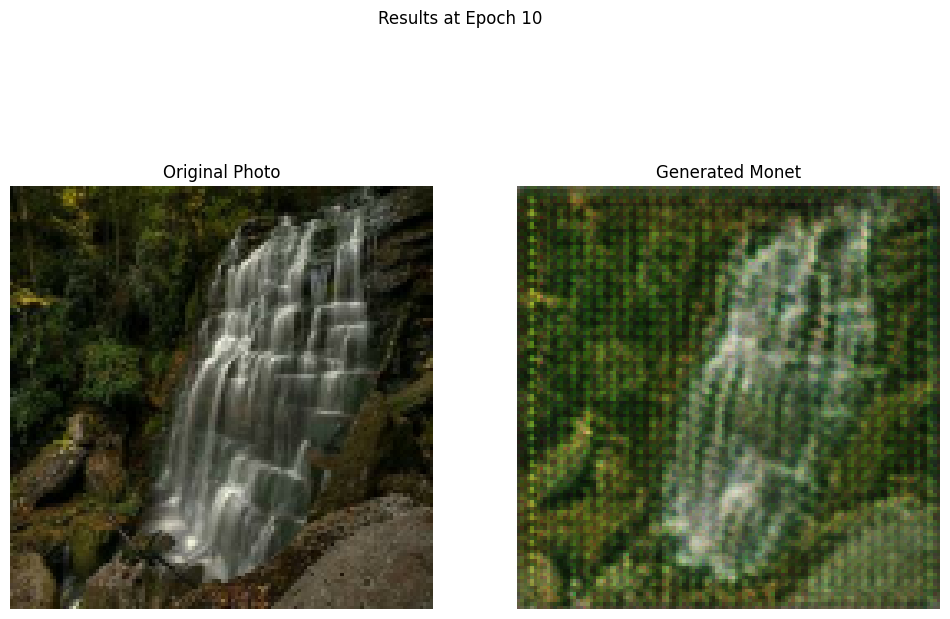

Epoch 11/50 completed | G_M: 3.2596, G_P: 3.1893, D_M: 0.3778, D_P: 0.4054
Epoch 12/50 completed | G_M: 3.2248, G_P: 3.1704, D_M: 0.3920, D_P: 0.3952
Epoch 13/50 completed | G_M: 3.1135, G_P: 3.0754, D_M: 0.4098, D_P: 0.4075
Epoch 14/50 completed | G_M: 3.0423, G_P: 2.9911, D_M: 0.4100, D_P: 0.3964
Epoch 15/50 completed | G_M: 2.9849, G_P: 2.9314, D_M: 0.3841, D_P: 0.3838
Epoch 16/50 completed | G_M: 2.9509, G_P: 2.9273, D_M: 0.4012, D_P: 0.3975
Epoch 17/50 completed | G_M: 2.8670, G_P: 2.8354, D_M: 0.4022, D_P: 0.3974
Epoch 18/50 completed | G_M: 2.8355, G_P: 2.7908, D_M: 0.3886, D_P: 0.3910
Epoch 19/50 completed | G_M: 2.7235, G_P: 2.6722, D_M: 0.3945, D_P: 0.3923
Epoch 20/50 completed | G_M: 2.7313, G_P: 2.7001, D_M: 0.4005, D_P: 0.3939


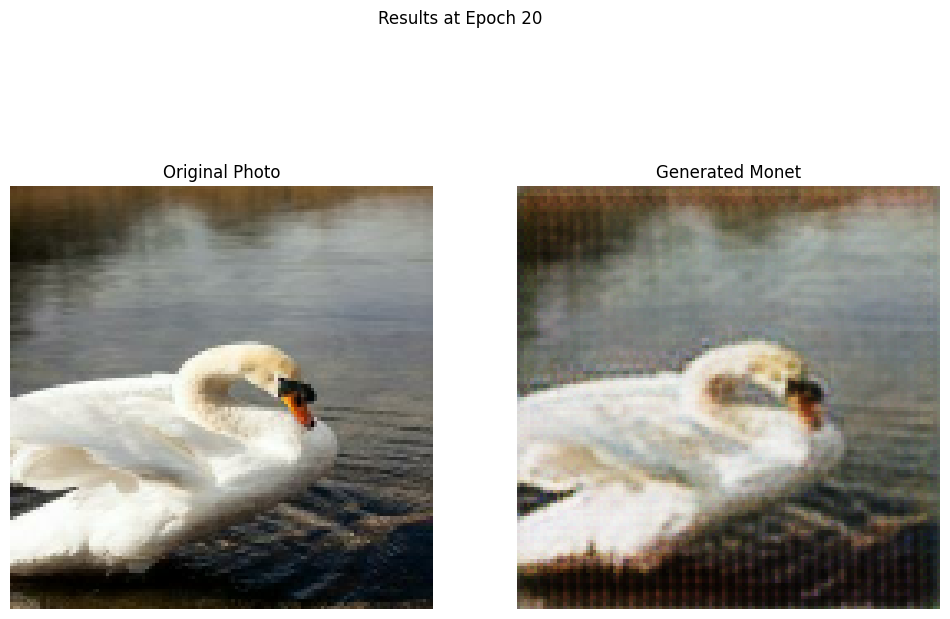

Epoch 21/50 completed | G_M: 2.7168, G_P: 2.6694, D_M: 0.3860, D_P: 0.3850
Epoch 22/50 completed | G_M: 2.7001, G_P: 2.6432, D_M: 0.3798, D_P: 0.3809
Epoch 23/50 completed | G_M: 2.6329, G_P: 2.5751, D_M: 0.3924, D_P: 0.4001
Epoch 24/50 completed | G_M: 2.6439, G_P: 2.6027, D_M: 0.3772, D_P: 0.3825
Epoch 25/50 completed | G_M: 2.6171, G_P: 2.5764, D_M: 0.3795, D_P: 0.3775
Epoch 26/50 completed | G_M: 2.5505, G_P: 2.4865, D_M: 0.3841, D_P: 0.3959
Epoch 27/50 completed | G_M: 2.5863, G_P: 2.5195, D_M: 0.3842, D_P: 0.3904
Epoch 28/50 completed | G_M: 2.5843, G_P: 2.5379, D_M: 0.3792, D_P: 0.3815
Epoch 29/50 completed | G_M: 2.5457, G_P: 2.4839, D_M: 0.3736, D_P: 0.3840
Epoch 30/50 completed | G_M: 2.5267, G_P: 2.4683, D_M: 0.3686, D_P: 0.3819


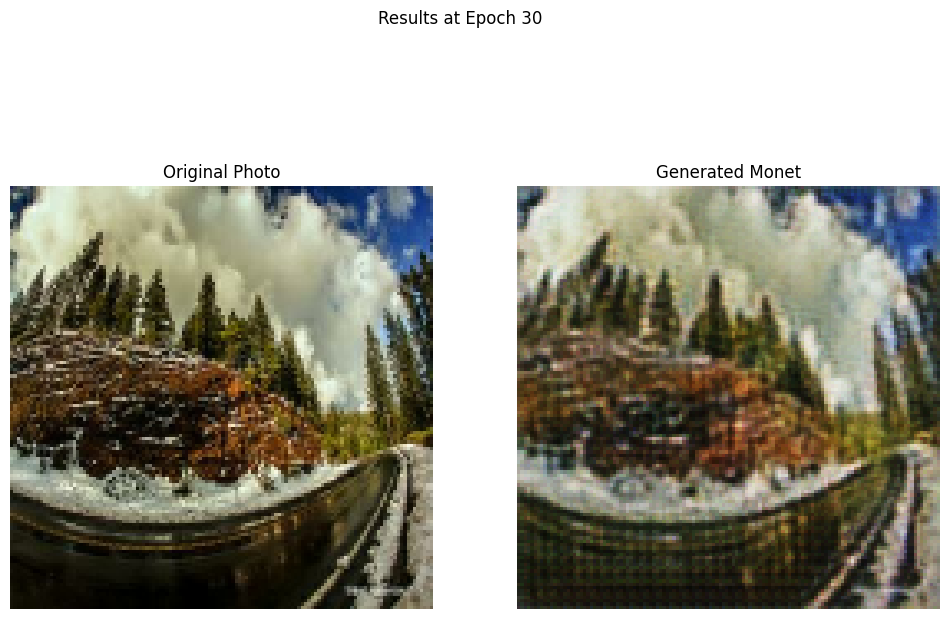

Epoch 31/50 completed | G_M: 2.5308, G_P: 2.4601, D_M: 0.3690, D_P: 0.3840
Epoch 32/50 completed | G_M: 2.4707, G_P: 2.3801, D_M: 0.3720, D_P: 0.3974
Epoch 33/50 completed | G_M: 2.4771, G_P: 2.3873, D_M: 0.3738, D_P: 0.3931
Epoch 34/50 completed | G_M: 2.4494, G_P: 2.3872, D_M: 0.3773, D_P: 0.3895
Epoch 35/50 completed | G_M: 2.4541, G_P: 2.3716, D_M: 0.3662, D_P: 0.3917
Epoch 36/50 completed | G_M: 2.4195, G_P: 2.3354, D_M: 0.3681, D_P: 0.3905
Epoch 37/50 completed | G_M: 2.4792, G_P: 2.3952, D_M: 0.3732, D_P: 0.3912
Epoch 38/50 completed | G_M: 2.4032, G_P: 2.3190, D_M: 0.3693, D_P: 0.3868
Epoch 39/50 completed | G_M: 2.4190, G_P: 2.3524, D_M: 0.3691, D_P: 0.3815
Epoch 40/50 completed | G_M: 2.4063, G_P: 2.3105, D_M: 0.3608, D_P: 0.3813


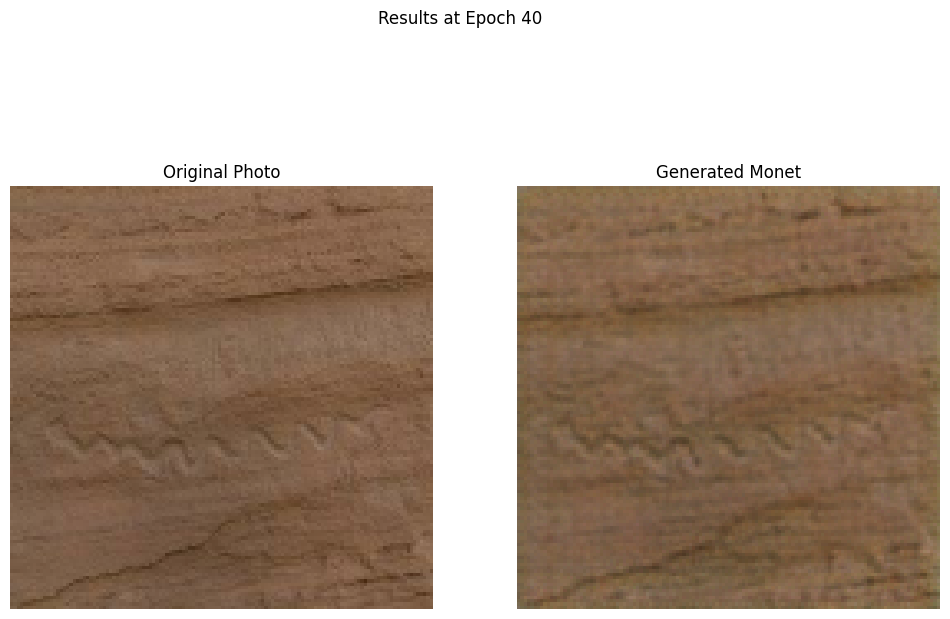

Epoch 41/50 completed | G_M: 2.3836, G_P: 2.3058, D_M: 0.3683, D_P: 0.3785
Epoch 42/50 completed | G_M: 2.3849, G_P: 2.2868, D_M: 0.3563, D_P: 0.3898
Epoch 43/50 completed | G_M: 2.3871, G_P: 2.2848, D_M: 0.3551, D_P: 0.3860
Epoch 44/50 completed | G_M: 2.4153, G_P: 2.3302, D_M: 0.3523, D_P: 0.3738
Epoch 45/50 completed | G_M: 2.3711, G_P: 2.2807, D_M: 0.3505, D_P: 0.3850
Epoch 46/50 completed | G_M: 2.3695, G_P: 2.2781, D_M: 0.3559, D_P: 0.3704
Epoch 47/50 completed | G_M: 2.3755, G_P: 2.2629, D_M: 0.3440, D_P: 0.3805
Epoch 48/50 completed | G_M: 2.3618, G_P: 2.2773, D_M: 0.3585, D_P: 0.3747
Epoch 49/50 completed | G_M: 2.4039, G_P: 2.3168, D_M: 0.3300, D_P: 0.3642
Epoch 50/50 completed | G_M: 2.3499, G_P: 2.2439, D_M: 0.3439, D_P: 0.3753


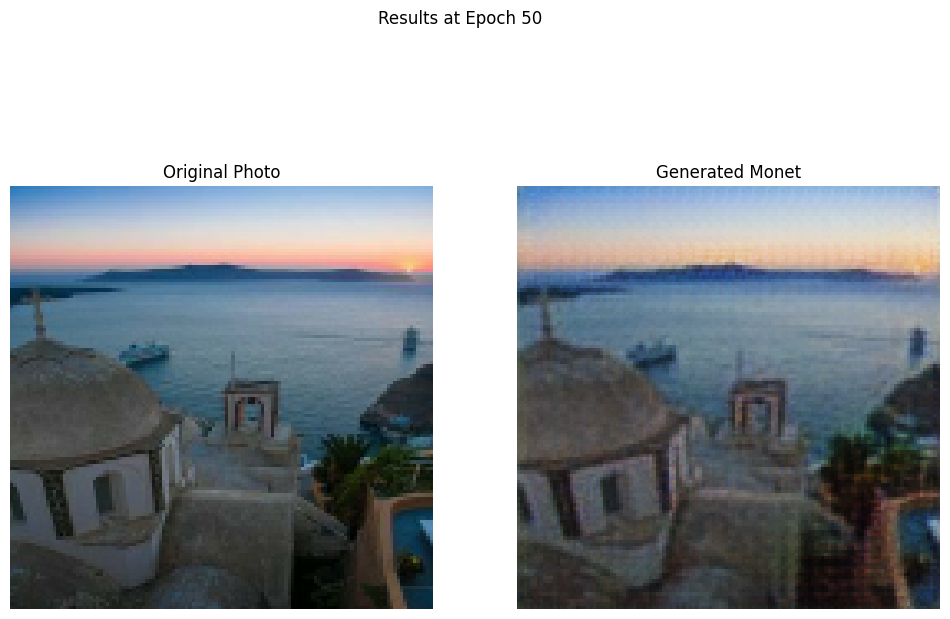

In [23]:
STEPS_PER_EPOCH = 300   # match Monet count
EPOCHS = 50

train(EPOCHS, STEPS_PER_EPOCH)

## Results

The generated Monet images clearly got better with more training, but there are still wavy artifacts visible. It is also apparent that the quality of the photos is degraded from shrinking them to 128 x 128 pixels.

Below I will plot the generator and discriminator loss functions vs. epoch:

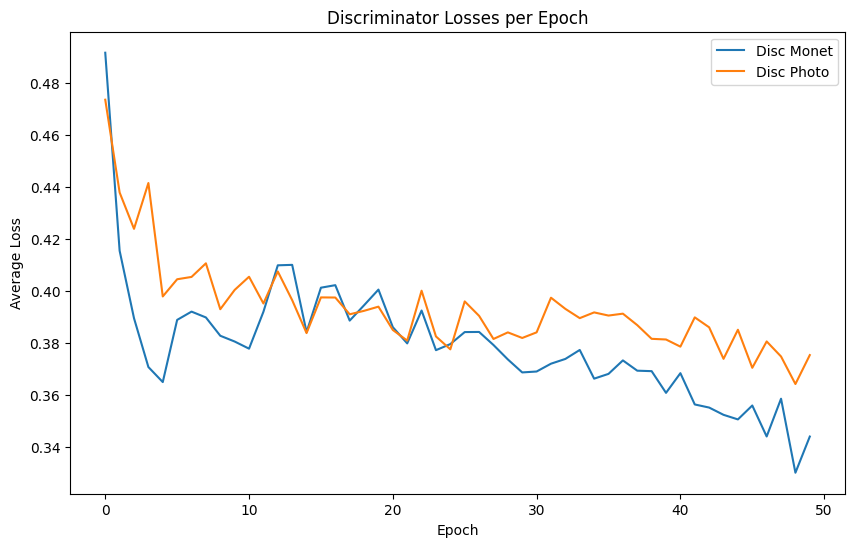

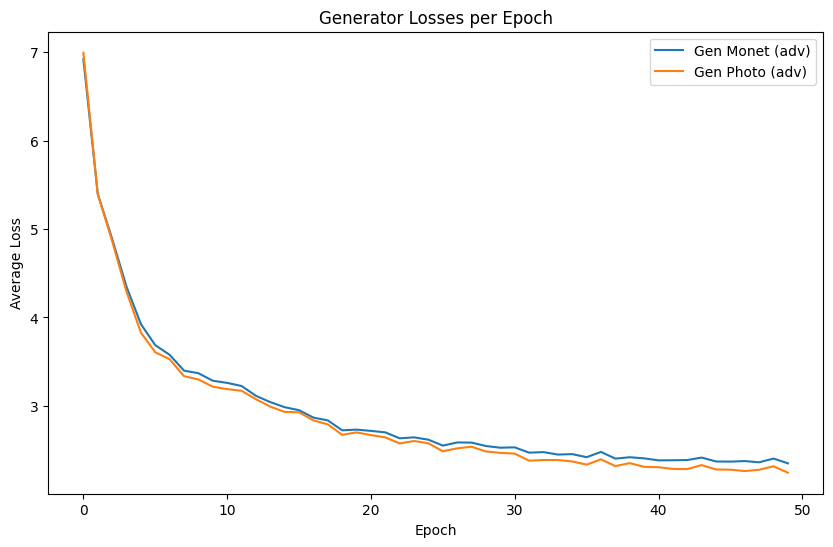

In [32]:
def plot_losses():
    plt.figure(figsize=(10,6))
    plt.plot(loss_history["D_M"], label="Disc Monet")
    plt.plot(loss_history["D_P"], label="Disc Photo")

    plt.xlabel("Epoch")
    plt.ylabel("Average Loss")
    plt.title("Discriminator Losses per Epoch")
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,6))
    plt.plot(loss_history["G_M"], label="Gen Monet (adv)")
    plt.plot(loss_history["G_P"], label="Gen Photo (adv)")
    
    plt.xlabel("Epoch")
    plt.ylabel("Average Loss")
    plt.title("Generator Losses per Epoch")
    plt.legend()
    plt.show()

plot_losses()

The generator loss functions seem to have leveled off, but it is not clear whether this is true for the discriminator, suggesting that the model could improve with more training, or perhaps an increase to the learning rate.

The code below applies the Monet generator to all of the sample photos and packages them in a zip file for submission to the Kaggle competition.

In [36]:
os.makedirs("/kaggle/working/images", exist_ok=True)

for i, img in enumerate(photos.take(n_photo)):
    # Run through generator
    fake_monet = G_Monet(img, training=False)[0].numpy()  # shape (256,256,3), values [-1,1]
    
    # Convert to [0,255] uint8
    fake_monet = ((fake_monet + 1.0) * 127.5).astype(np.uint8)
    
    # Save as jpg
    Image.fromarray(fake_monet).save(f"images/monet_{i:04d}.jpg")

with zipfile.ZipFile("images.zip", "w") as zipf:
    for file in os.listdir("images"):
        zipf.write(os.path.join("images", file), arcname=file)

shutil.rmtree("images")

This first test took about 30 minutes to run (using GPU) and received a score of 85.85 from Kaggle using the MiFID (Memorization-informed Fréchet Inception Distance) metric.

I will now run a second test using the full 256 x 256 pixel dimensions for the input. I have also increased the initial number of filters in the generators and discriminators from 32 to 64, and the number of residual blocks in the generators from 6 to 9.

Epoch 1/50 completed | G_M: 7.1889, G_P: 7.2761, D_M: 0.5082, D_P: 0.5282
Epoch 2/50 completed | G_M: 5.5621, G_P: 5.5570, D_M: 0.3948, D_P: 0.4332
Epoch 3/50 completed | G_M: 4.6411, G_P: 4.5824, D_M: 0.3718, D_P: 0.3876
Epoch 4/50 completed | G_M: 4.1419, G_P: 4.0576, D_M: 0.3373, D_P: 0.3940
Epoch 5/50 completed | G_M: 3.8372, G_P: 3.8147, D_M: 0.3780, D_P: 0.3928
Epoch 6/50 completed | G_M: 3.6121, G_P: 3.5621, D_M: 0.3735, D_P: 0.3948
Epoch 7/50 completed | G_M: 3.4940, G_P: 3.4287, D_M: 0.3653, D_P: 0.3954
Epoch 8/50 completed | G_M: 3.4228, G_P: 3.3749, D_M: 0.3750, D_P: 0.3931
Epoch 9/50 completed | G_M: 3.3235, G_P: 3.2672, D_M: 0.3773, D_P: 0.4002
Epoch 10/50 completed | G_M: 3.2278, G_P: 3.1695, D_M: 0.3523, D_P: 0.3971


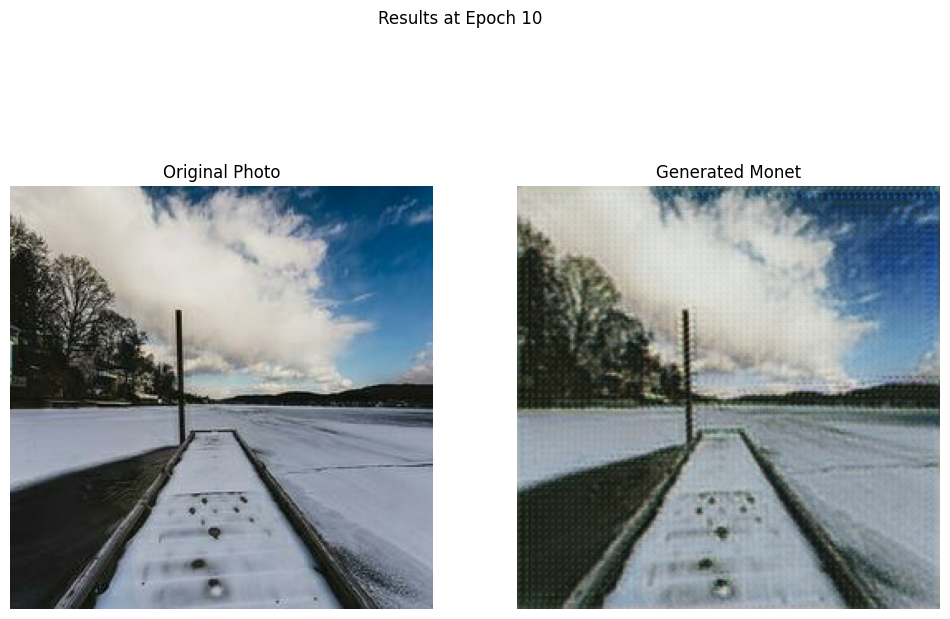

Epoch 11/50 completed | G_M: 3.2541, G_P: 3.1093, D_M: 0.3214, D_P: 0.3973
Epoch 12/50 completed | G_M: 3.2886, G_P: 3.1088, D_M: 0.2962, D_P: 0.3958
Epoch 13/50 completed | G_M: 3.2615, G_P: 3.0377, D_M: 0.2831, D_P: 0.3862
Epoch 14/50 completed | G_M: 3.2155, G_P: 3.0011, D_M: 0.2880, D_P: 0.3864
Epoch 15/50 completed | G_M: 3.1528, G_P: 2.9518, D_M: 0.2930, D_P: 0.3778
Epoch 16/50 completed | G_M: 3.1138, G_P: 2.9142, D_M: 0.2747, D_P: 0.3685
Epoch 17/50 completed | G_M: 3.0241, G_P: 2.8499, D_M: 0.2848, D_P: 0.3631
Epoch 18/50 completed | G_M: 2.9460, G_P: 2.7861, D_M: 0.2891, D_P: 0.3787
Epoch 19/50 completed | G_M: 2.9086, G_P: 2.7553, D_M: 0.2982, D_P: 0.3660
Epoch 20/50 completed | G_M: 2.8502, G_P: 2.6795, D_M: 0.2901, D_P: 0.3707


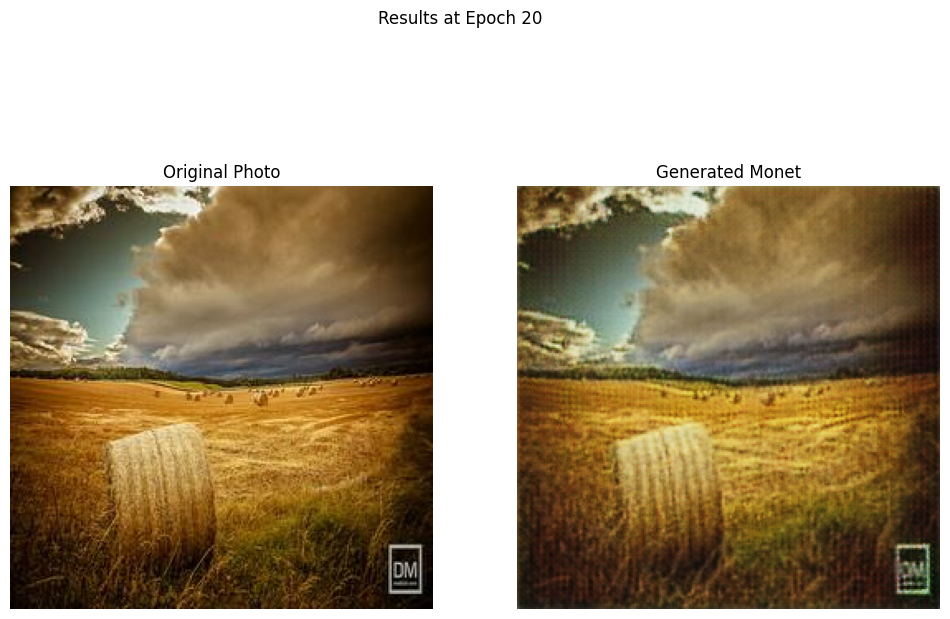

Epoch 21/50 completed | G_M: 2.8280, G_P: 2.7015, D_M: 0.3042, D_P: 0.3720
Epoch 22/50 completed | G_M: 2.8312, G_P: 2.7267, D_M: 0.3039, D_P: 0.3679
Epoch 23/50 completed | G_M: 2.7311, G_P: 2.5991, D_M: 0.3129, D_P: 0.3784
Epoch 24/50 completed | G_M: 2.7231, G_P: 2.5714, D_M: 0.3092, D_P: 0.3865
Epoch 25/50 completed | G_M: 2.6235, G_P: 2.4582, D_M: 0.3134, D_P: 0.3967
Epoch 26/50 completed | G_M: 2.6260, G_P: 2.5046, D_M: 0.3331, D_P: 0.3925
Epoch 27/50 completed | G_M: 2.5997, G_P: 2.4880, D_M: 0.3305, D_P: 0.3827
Epoch 28/50 completed | G_M: 2.5552, G_P: 2.4342, D_M: 0.3499, D_P: 0.4038
Epoch 29/50 completed | G_M: 2.5019, G_P: 2.3704, D_M: 0.3219, D_P: 0.4036
Epoch 30/50 completed | G_M: 2.4975, G_P: 2.3485, D_M: 0.3240, D_P: 0.4095


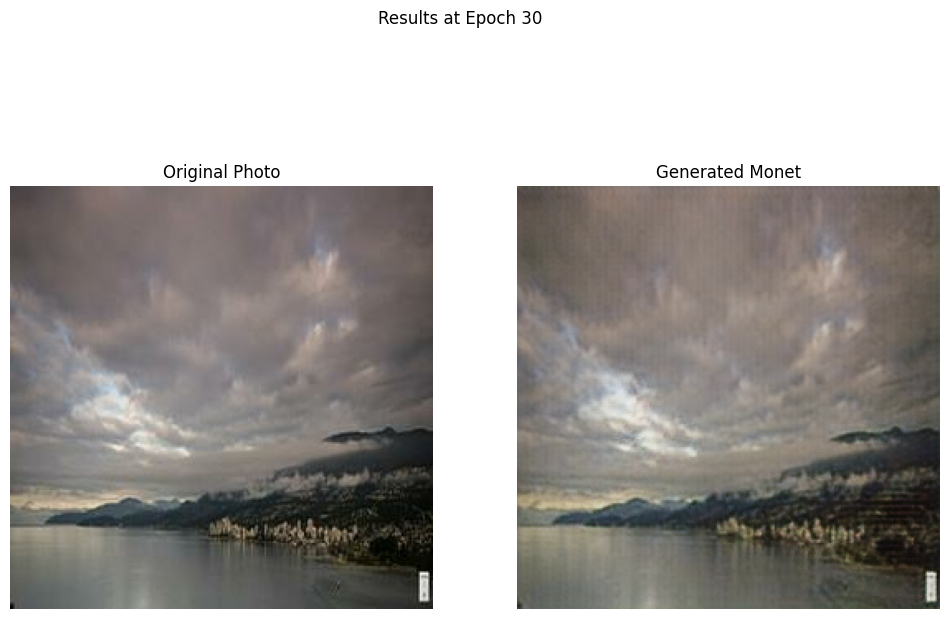

Epoch 31/50 completed | G_M: 2.4921, G_P: 2.3596, D_M: 0.3264, D_P: 0.4055
Epoch 32/50 completed | G_M: 2.4809, G_P: 2.3211, D_M: 0.3177, D_P: 0.3918
Epoch 33/50 completed | G_M: 2.4633, G_P: 2.3267, D_M: 0.3382, D_P: 0.4077
Epoch 34/50 completed | G_M: 2.3981, G_P: 2.2685, D_M: 0.3347, D_P: 0.4141
Epoch 35/50 completed | G_M: 2.4235, G_P: 2.2887, D_M: 0.3392, D_P: 0.4048
Epoch 36/50 completed | G_M: 2.3471, G_P: 2.2100, D_M: 0.3403, D_P: 0.4046
Epoch 37/50 completed | G_M: 2.3610, G_P: 2.2314, D_M: 0.3408, D_P: 0.4215
Epoch 38/50 completed | G_M: 2.3744, G_P: 2.2269, D_M: 0.3269, D_P: 0.4128
Epoch 39/50 completed | G_M: 2.3508, G_P: 2.2057, D_M: 0.3393, D_P: 0.4167
Epoch 40/50 completed | G_M: 2.3133, G_P: 2.1723, D_M: 0.3316, D_P: 0.3979


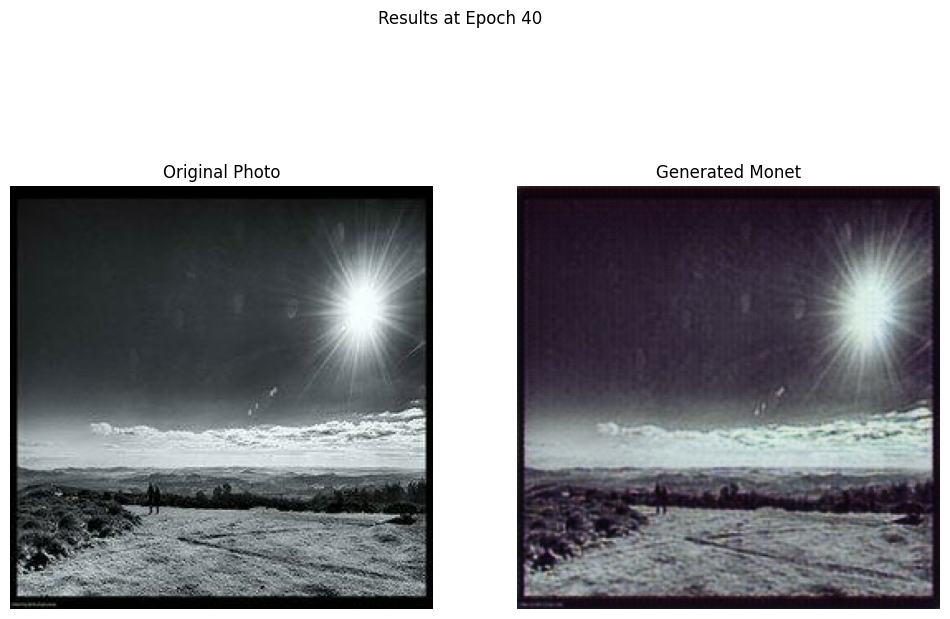

Epoch 41/50 completed | G_M: 2.2804, G_P: 2.1611, D_M: 0.3526, D_P: 0.4118
Epoch 42/50 completed | G_M: 2.2973, G_P: 2.1920, D_M: 0.3430, D_P: 0.4055
Epoch 43/50 completed | G_M: 2.2833, G_P: 2.1791, D_M: 0.3434, D_P: 0.4011
Epoch 44/50 completed | G_M: 2.2341, G_P: 2.1266, D_M: 0.3489, D_P: 0.4022
Epoch 45/50 completed | G_M: 2.2333, G_P: 2.0901, D_M: 0.3317, D_P: 0.4062
Epoch 46/50 completed | G_M: 2.2767, G_P: 2.1455, D_M: 0.3433, D_P: 0.4072
Epoch 47/50 completed | G_M: 2.2439, G_P: 2.1188, D_M: 0.3313, D_P: 0.4017
Epoch 48/50 completed | G_M: 2.1573, G_P: 2.0318, D_M: 0.3472, D_P: 0.4027
Epoch 49/50 completed | G_M: 2.2029, G_P: 2.0832, D_M: 0.3347, D_P: 0.4005
Epoch 50/50 completed | G_M: 2.2202, G_P: 2.0772, D_M: 0.3212, D_P: 0.4035


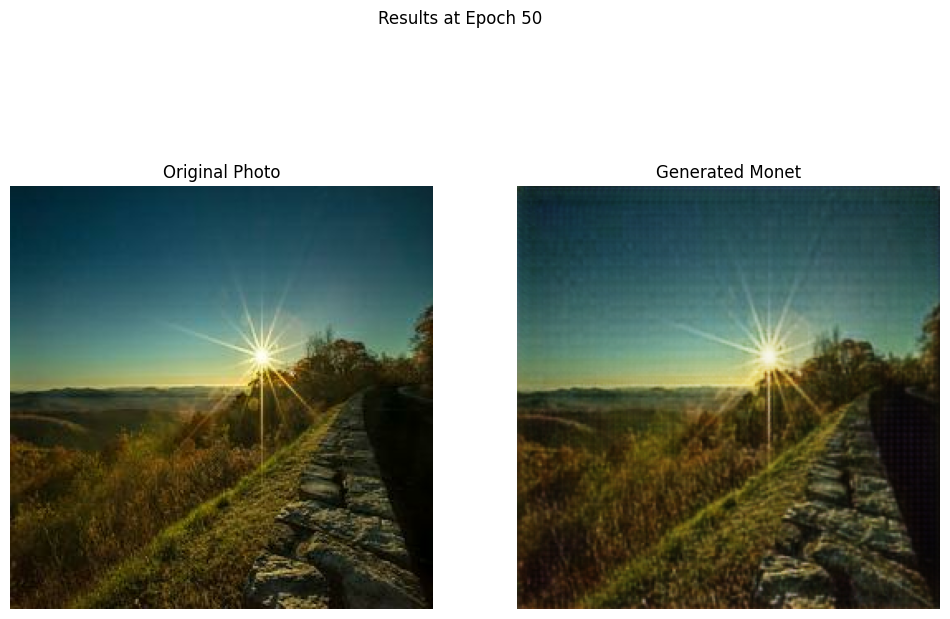

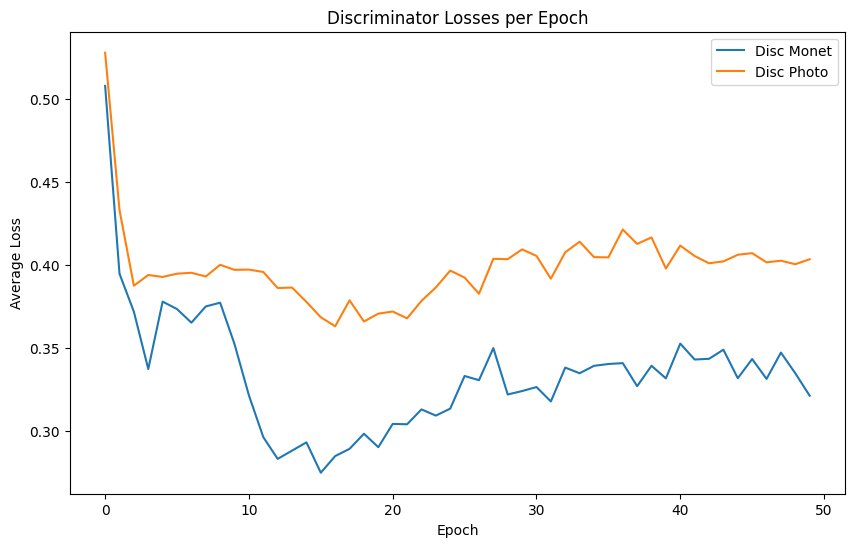

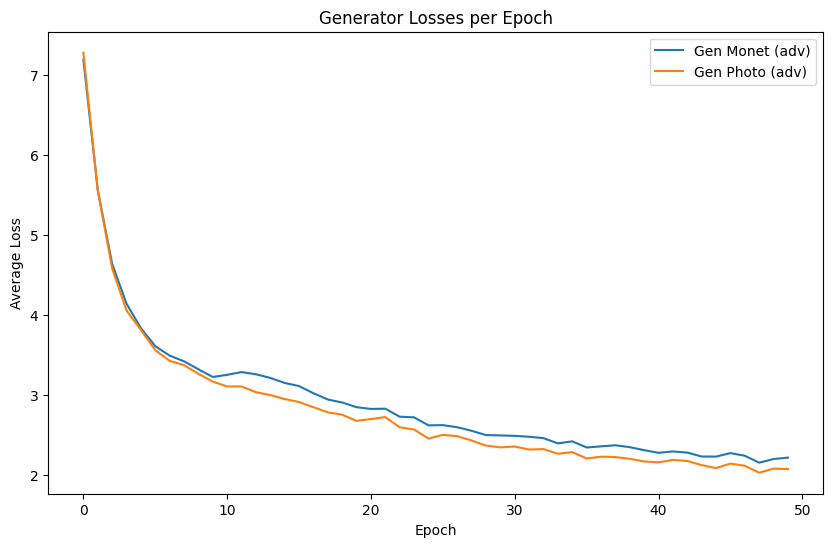

In [39]:
tf.keras.backend.clear_session()

pixel_dim = 256

monets = (tf.data.Dataset.list_files(path_monet + "*.jpg", shuffle=True)
          .map(lambda x: preprocess(x, pixel_dim), num_parallel_calls=tf.data.AUTOTUNE)
          .shuffle(n_monet)
          .repeat()
          .batch(1)
          .prefetch(tf.data.AUTOTUNE))

photos = (tf.data.Dataset.list_files(path_photo + "*.jpg", shuffle=True)
          .filter(not_excluded)
          .map(lambda x: preprocess(x, pixel_dim), num_parallel_calls=tf.data.AUTOTUNE)
          .shuffle(n_photo)
          .repeat()
          .batch(1)
          .prefetch(tf.data.AUTOTUNE))

n_filters = 64
n_res_blocks = 9

G_Monet = build_generator(pixel_dim, n_filters, n_res_blocks)
G_Photo = build_generator(pixel_dim, n_filters, n_res_blocks)
D_Monet = build_discriminator(pixel_dim, n_filters)
D_Photo = build_discriminator(pixel_dim, n_filters)

gen_M_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
gen_P_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_M_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_P_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

loss_history = {
    "G_M": [],   # Monet generator
    "G_P": [],   # Photo generator
    "D_M": [],   # Monet discriminator
    "D_P": [],   # Photo discriminator
}

train_step = compile_train_step(G_Monet, G_Photo, D_Monet, D_Photo,
                             gen_M_optimizer, gen_P_optimizer,
                             disc_M_optimizer, disc_P_optimizer)
train(EPOCHS, STEPS_PER_EPOCH)
plot_losses()

This time, training took nearly 2 hours, but the results look better visually. Discriminator losses seem to have increased slightly from a low point near epoch 15, while generator losses have decreased gradually and begun to level off by the 50th epoch. This run received a score of 70.61 from Kaggle, a significant improvement.

In [ ]:
os.makedirs("/kaggle/working/images", exist_ok=True)

for i, img in enumerate(photos.take(n_photo)):
    # Run through generator
    fake_monet = G_Monet(img, training=False)[0].numpy()  # shape (256,256,3), values [-1,1]
    
    # Convert to [0,255] uint8
    fake_monet = ((fake_monet + 1.0) * 127.5).astype(np.uint8)
    
    # Save as jpg
    Image.fromarray(fake_monet).save(f"images/monet_{i:04d}.jpg")

with zipfile.ZipFile("images.zip", "w") as zipf:
    for file in os.listdir("images"):
        zipf.write(os.path.join("images", file), arcname=file)

shutil.rmtree("images")

## Conclusion

For this project, I successfully built and trained a CycleGAN model to generate Monet-style paintings using photographs as templates. The first test run, using downsampled photographs for efficiency, scored 85.85 in the Kaggle MiFID metric. The second run, using the full resolution of the photographs and increasing the number of parameters in the model, brought that score down to 70.61. Further improvements could come from tuning more hyperparameters such as the learning rate, or experimenting with different architectures in the generator and discriminator, such as trying different activation functions or adding dropout layers. One interesting result from the plots of loss functions vs. epoch is that the discriminators' average loss is increasing slightly while the generators' is decreasing. Perhaps a more powerful and optimized discriminator could drive further improvement in the model.